In [1]:
import numpy as np 
import pandas as pd
import os
import matplotlib.pyplot as plt
from ema_workbench.analysis import parcoords
from ema_workbench.analysis import pairs_plotting
from ema_workbench.analysis import feature_scoring
import seaborn as sns
from sideFunctions import combineResults, pairsPlotEMA, plotHeatmap, parallelPlot, minimizeDF, getDf, getScenarios

dirname = os.path.dirname(os.path.abspath('__file__'))
resultFolder = os.path.join(dirname, 'Results')
figureFolder = os.path.join(resultFolder, 'Figures')

/home/martijn/Documents/Work/CoronaPersonalStealing/NoveltySearchEMA/venv/lib/python3.8/site-packages/ema_workbench/analysis/prim.py:30: ImportWarning: altair based interactive inspection not available
  warnings.warn(("altair based interactive "


In [2]:
nsDf1k = getDf(4, True, nfe=1000)
nsDf10k = getDf(4, True, nfe=10000)
nsDf100k = getDf(4, True, nfe=100000)
nsDf = getDf(4, True, nfe=1000000)
# print(nsDf.head())

In [3]:
lhcDf = getDf(4, False, nfe=1000000)
lhcDf1k = getDf(4, False, nfe=1000)
lhcDf10k = getDf(4, False, nfe=10000)
lhcDf100k = getDf(4, False, nfe=10000)
# print(lhcDf.head())

In [14]:
# lhcDfCompare = lhcDf[['b', 'q', 'mean', 'stdev', 'delta', 'max_P', 'utility', 'inertia', 'reliability']]
# nsDfCompare = nsDf[['b', 'q', 'mean', 'stdev', 'delta', 'max_P', 'utility', 'inertia', 'reliability']]

# lhcDfCompare = lhcDf[['max_P', 'utility', 'inertia', 'reliability']]
lhcDfCompare = nsDf10k[['max_P', 'utility', 'inertia', 'reliability']]
nsDfCompare = nsDf[['max_P', 'utility', 'inertia', 'reliability']]

df_diff = pd.concat([nsDfCompare,lhcDfCompare]).drop_duplicates(keep=False)
# df_diff_2 = pd.concat([df_diff,lhcDfCompare]).drop_duplicates(keep=False)
print(len(df_diff))
print(len(lhcDfCompare))
print(len(nsDfCompare))

31
16
15


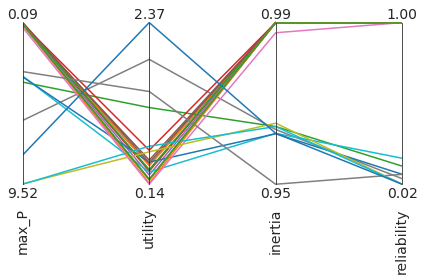

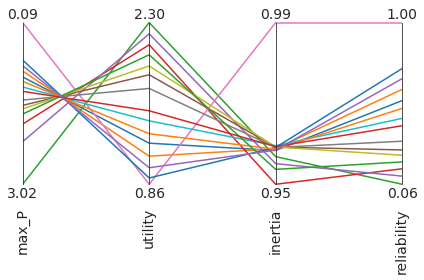

In [4]:
lhcDfMin = minimizeDF(lhcDf, 15)
parallelPlot(lhcDfMin, 'test-LHC-Experiment_Policy4-nfe1000000')
parallelPlot(nsDf, 'test-NoveltySearch-Experiment_Policy4-nfe1000000')

In [5]:

# limitLHC = pd.Series([lhcDfMin.min(), lhcDfMin.max()])
lhcDfMinTest = lhcDfMin[['b', 'q', 'mean', 'stdev', 'delta', 'max_P', 'utility', 'inertia', 'reliability']]
nsDfTest = nsDf[['b', 'q', 'mean', 'stdev', 'delta', 'max_P', 'utility', 'inertia', 'reliability']]
# print(lhcDfMinTest.head())
# print(nsDfTest.head())
minlist = []
maxlist = []
for (colName, colDat) in nsDfTest.iteritems():
    # print(str(nsDfTest[colName])+" compared to "+str(lhcDfMinTest[colName]))
    minlist.append(min(nsDfTest[colName].min(), lhcDfMinTest[colName].min()))
    maxlist.append(max(nsDfTest[colName].max(), lhcDfMinTest[colName].max()))
limit = pd.DataFrame([minlist, maxlist], columns=['b', 'q', 'mean', 'stdev', 'delta', 'max_P', 'utility', 'inertia', 'reliability'])
# print(limit.head())
# limitNs = pd.Series([nsDfTest.min(), nsDfTest.max()], index=['b', 'q', 'mean', 'stdev', 'delta', 'max_P', 'utility', 'inertia', 'reliability'])
# print(limitNs.axes)
# for index, row in limitNs.items():
#     print(row)
# print(limitLHC)
# print(limitNs)

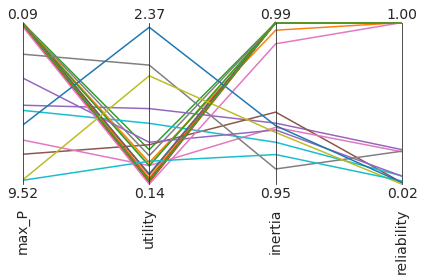

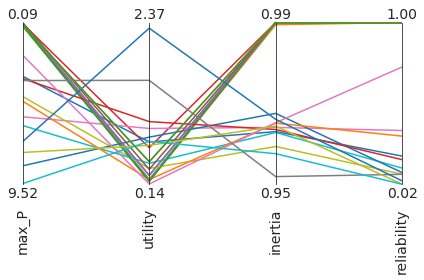

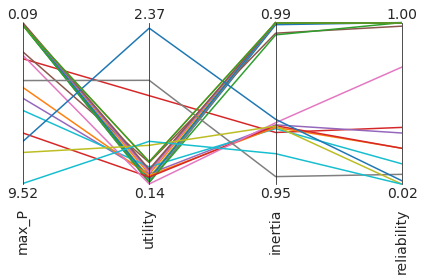

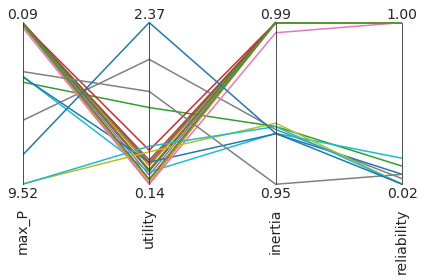

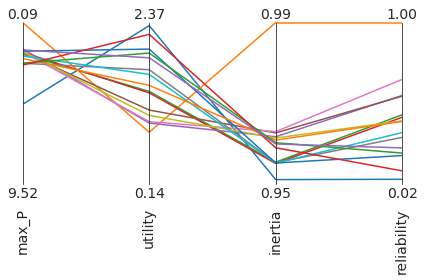

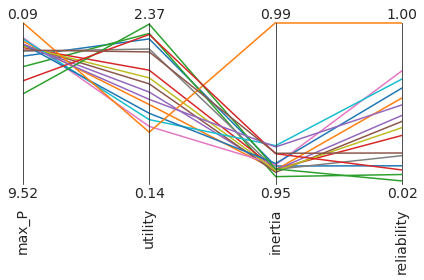

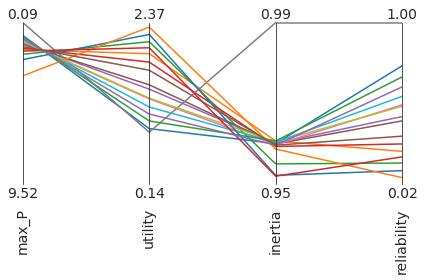

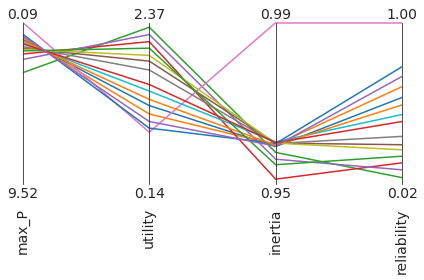

In [8]:
lhcDf1kMin = minimizeDF(lhcDf1k, 15)
lhcDf10kMin = minimizeDF(lhcDf10k, 15)
lhcDf100kMin = minimizeDF(lhcDf100k,15)
parallelPlot(lhcDf1kMin, 'test-LHC-Experiment_Policy4-nfe1000-normalized', limits=limit)
parallelPlot(lhcDf10kMin, 'test-LHC-Experiment_Policy4-nfe10000-normalized', limits=limit)
parallelPlot(lhcDf100kMin, 'test-LHC-Experiment_Policy4-nfe100000-normalized', limits=limit)
parallelPlot(lhcDfMin, 'test-LHC-Experiment_Policy4-nfe1000000-normalized', limits=limit)
parallelPlot(nsDf1k, 'test-NoveltySearch-Experiment_Policy4-nfe1000-normalized', limits=limit)
parallelPlot(nsDf10k, 'test-NoveltySearch-Experiment_Policy4-nfe10000-normalized', limits=limit)
parallelPlot(nsDf100k, 'test-NoveltySearch-Experiment_Policy4-nfe100000-normalized', limits=limit)
parallelPlot(nsDf, 'test-NoveltySearch-Experiment_Policy4-nfe1000000-normalized', limits=limit)


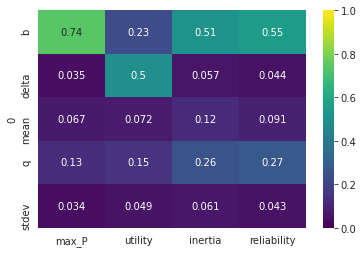

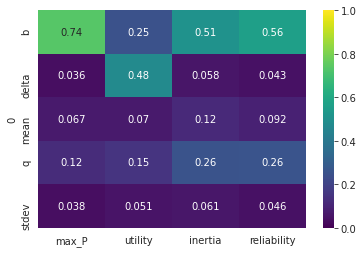

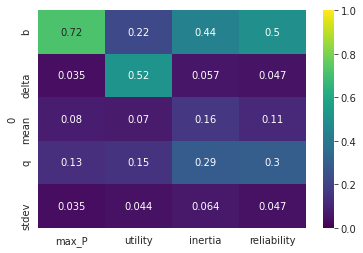

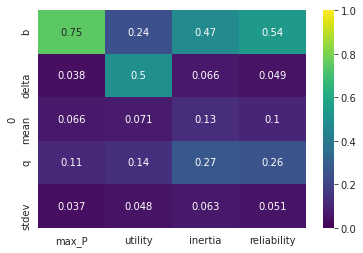

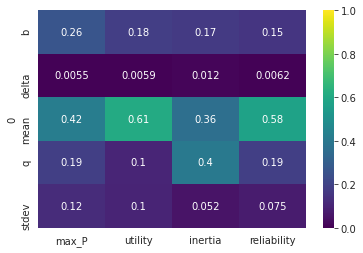

In [11]:
lhcDfMin = minimizeDF(lhcDf, 1000)
lhcDf10kMin = minimizeDF(lhcDf10k, 1000)
lhcDf100kMin = minimizeDF(lhcDf100k, 1000)
plotHeatmap(lhcDf1k, 'test-LHC-Experiment_Policy4-nfe1000')
plotHeatmap(lhcDf10kMin, 'test-LHC-Experiment_Policy4-nfe10000')
plotHeatmap(lhcDf100kMin, 'test-LHC-Experiment_Policy4-nfe100000')
plotHeatmap(lhcDfMin, 'test-LHC-Experiment_Policy4-nfe1000000')
plotHeatmap(nsDf, 'test-NoveltySearch-Experiment_Policy4-nfe1000000')

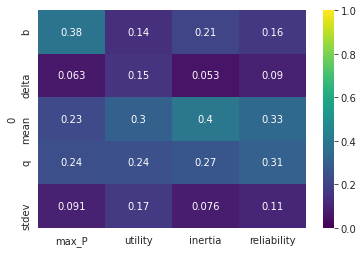

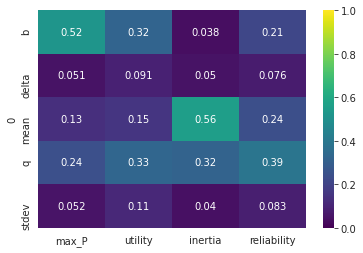

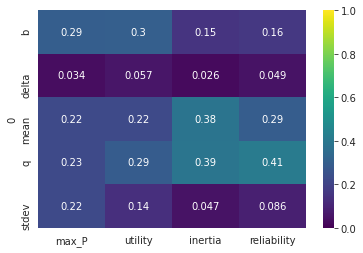

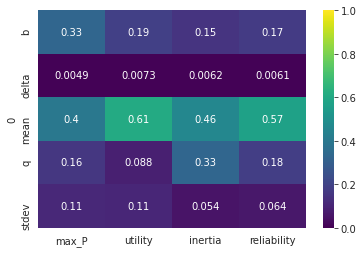

In [9]:
plotHeatmap(nsDf1k, 'NoveltySearch-Experiment_Policy4-nfe1000')
plotHeatmap(nsDf10k, 'NoveltySearch-Experiment_Policy4-nfe10000')
plotHeatmap(nsDf100k, 'NoveltySearch-Experiment_Policy4-nfe100000')
plotHeatmap(nsDf, 'NoveltySearch-Experiment_Policy4-nfe1000000')

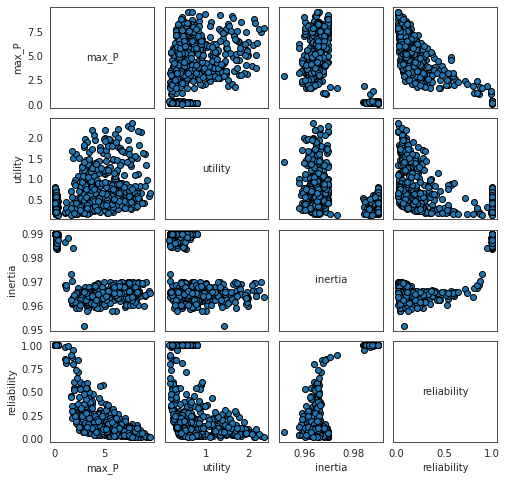

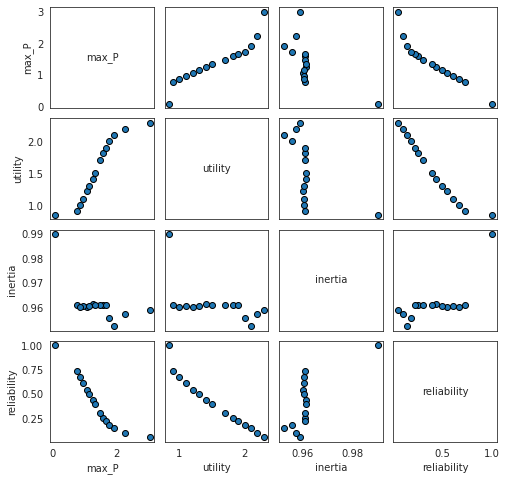

In [15]:

lhcLim = pairsPlotEMA(lhcDfMin, 'test-LHC-Experiment_Policy4-nfe1000000')
nsLim = pairsPlotEMA(nsDf, 'test-NoveltySearch-Experiment_Policy4-nfe1000000')

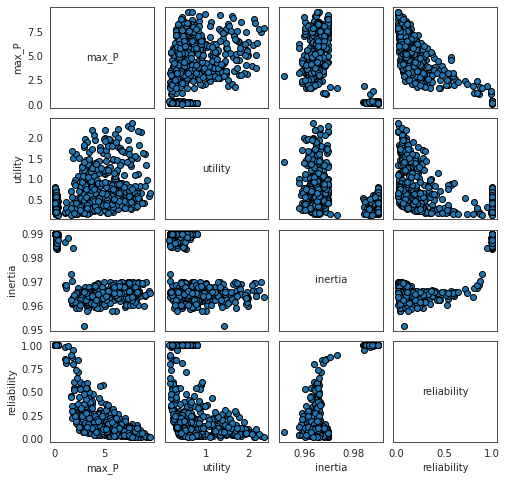

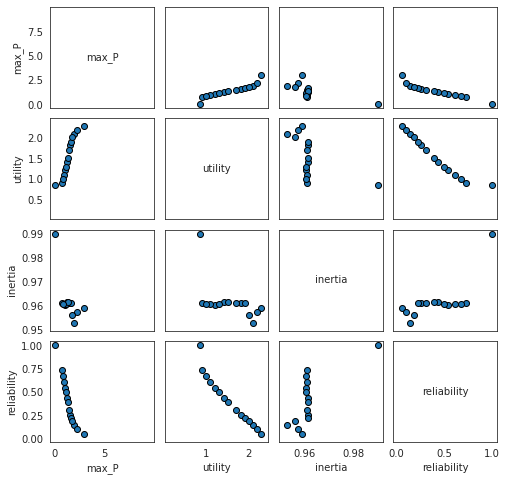

{('max_P', 'max_P'): <AxesSubplot:ylabel='max_P'>,
 ('max_P', 'utility'): <AxesSubplot:>,
 ('max_P', 'inertia'): <AxesSubplot:>,
 ('max_P', 'reliability'): <AxesSubplot:>,
 ('utility', 'max_P'): <AxesSubplot:ylabel='utility'>,
 ('utility', 'utility'): <AxesSubplot:>,
 ('utility', 'inertia'): <AxesSubplot:>,
 ('utility', 'reliability'): <AxesSubplot:>,
 ('inertia', 'max_P'): <AxesSubplot:ylabel='inertia'>,
 ('inertia', 'utility'): <AxesSubplot:>,
 ('inertia', 'inertia'): <AxesSubplot:>,
 ('inertia', 'reliability'): <AxesSubplot:>,
 ('reliability', 'max_P'): <AxesSubplot:xlabel='max_P', ylabel='reliability'>,
 ('reliability', 'utility'): <AxesSubplot:xlabel='utility'>,
 ('reliability', 'inertia'): <AxesSubplot:xlabel='inertia'>,
 ('reliability', 'reliability'): <AxesSubplot:xlabel='reliability'>}

In [16]:
pairsPlotEMA(lhcDfMin, 'test-LHC-Experiment_Policy4-nfe1000000-normalized', lhcLim)
pairsPlotEMA(nsDf, 'test-NoveltySearch-Experiment_Policy4-nfe1000000-normalized', lhcLim)

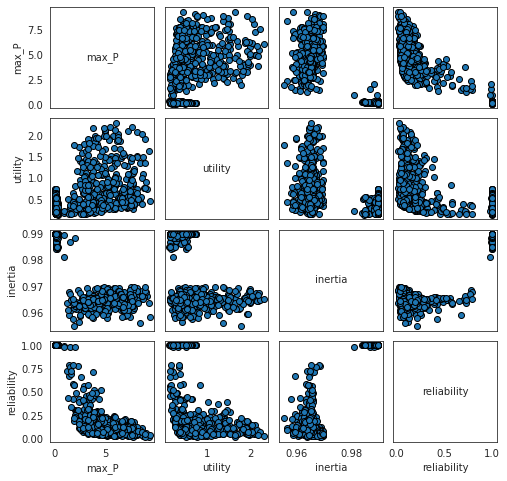

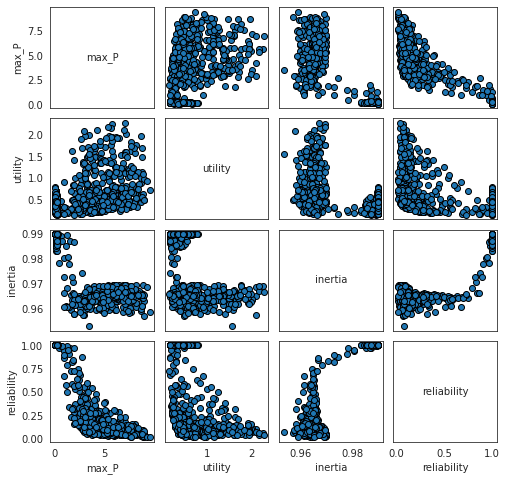

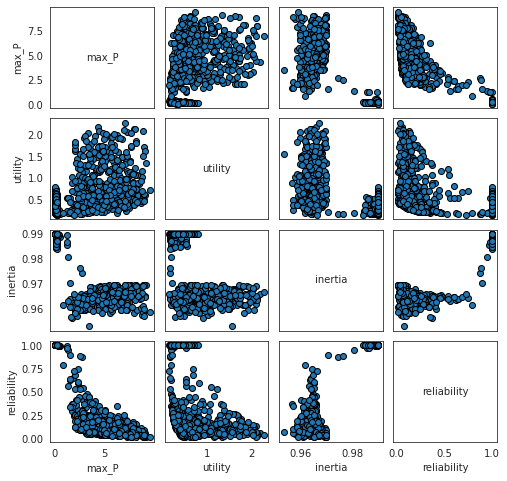

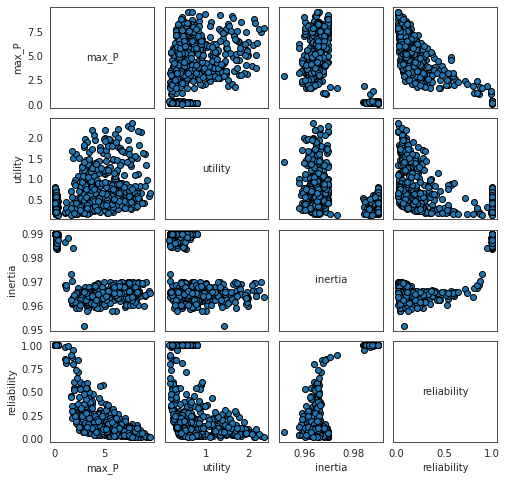

In [17]:
lhcLim1k = pairsPlotEMA(lhcDf1k, 'test-LHC-Experiment_Policy4-nfe1000')
lhcLim10k = pairsPlotEMA(lhcDf10kMin, 'test-LHC-Experiment_Policy4-nfe10000')
lhcLim100k = pairsPlotEMA(lhcDf100kMin, 'test-LHC-Experiment_Policy4-nfe100000')
lhcLim = pairsPlotEMA(lhcDfMin, 'test-LHC-Experiment_Policy4-nfe1000000')
# nsLim = pairsPlotEMA(nsDf, 'test-NoveltySearch-Experiment_Policy4-nfe1000000')

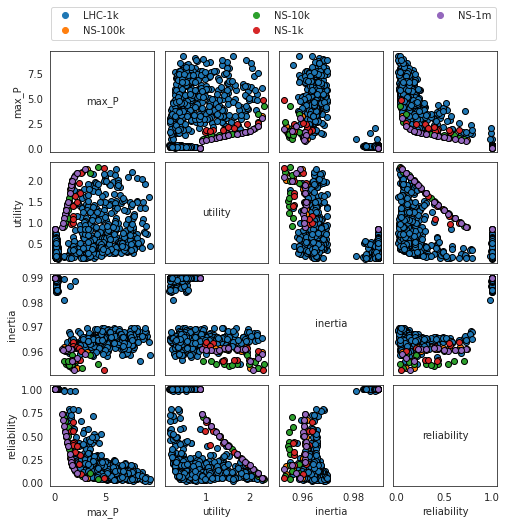

{('max_P', 'max_P'): <AxesSubplot:ylabel='max_P'>,
 ('max_P', 'utility'): <AxesSubplot:>,
 ('max_P', 'inertia'): <AxesSubplot:>,
 ('max_P', 'reliability'): <AxesSubplot:>,
 ('utility', 'max_P'): <AxesSubplot:ylabel='utility'>,
 ('utility', 'utility'): <AxesSubplot:>,
 ('utility', 'inertia'): <AxesSubplot:>,
 ('utility', 'reliability'): <AxesSubplot:>,
 ('inertia', 'max_P'): <AxesSubplot:ylabel='inertia'>,
 ('inertia', 'utility'): <AxesSubplot:>,
 ('inertia', 'inertia'): <AxesSubplot:>,
 ('inertia', 'reliability'): <AxesSubplot:>,
 ('reliability', 'max_P'): <AxesSubplot:xlabel='max_P', ylabel='reliability'>,
 ('reliability', 'utility'): <AxesSubplot:xlabel='utility'>,
 ('reliability', 'inertia'): <AxesSubplot:xlabel='inertia'>,
 ('reliability', 'reliability'): <AxesSubplot:xlabel='reliability'>}

In [20]:
lhcDfMin = minimizeDF(lhcDf, 1000)
nsDf['type'] = "NS-1m"
nsDf1k['type'] = "NS-1k"
nsDf10k['type'] = "NS-10k"
nsDf100k['type'] = "NS-100k"
lhcDf1k['type'] = "LHC-1k"
# lhcDf10kMin['type'] = "LHC-10k"
# lhcDf100kMin['type'] = "LHC-100k"
# lhcDfMin['type'] = "LHC-1m"
conDf = pd.concat([nsDf, nsDf1k, nsDf10k, nsDf100k, lhcDf1k]) #, lhcDf10kMin, lhcDf100kMin,lhcDfMin])
# print(conDf)
pairsPlotEMA(conDf, 'Experiment_Policy4-combined-1k', groupby='type')

In [10]:
getScenarios(nsDf)

Scenario('scenarioReference0', b=0.45, q=2.0, mean=0.0354123265533665, stdev=0.001, delta=0.99),
Scenario('scenarioReference1', b=0.4496170630997843, q=2.0018752345572115, mean=0.0348829072947084, stdev=0.0010104578152272, delta=0.99),
Scenario('scenarioReference2', b=0.3107152558661046, q=2.0, mean=0.0499981744957417, stdev=0.0012678207489186, delta=0.99),
Scenario('scenarioReference3', b=0.4263503968895447, q=2.0, mean=0.05, stdev=0.001, delta=0.99),
Scenario('scenarioReference4', b=0.3884246862705611, q=2.0008193100926808, mean=0.05, stdev=0.001001816212664, delta=0.99),
Scenario('scenarioReference5', b=0.45, q=2.0, mean=0.0436036500454985, stdev=0.001, delta=0.99),
Scenario('scenarioReference6', b=0.45, q=4.5, mean=0.01, stdev=0.001, delta=0.99),
Scenario('scenarioReference7', b=0.45, q=2.0, mean=0.0407182803266393, stdev=0.001, delta=0.99),
Scenario('scenarioReference8', b=0.45, q=2.0, mean=0.0462107633802667, stdev=0.001, delta=0.99),
Scenario('scenarioReference9', b=0.4499877495